In [1]:
%cd ..
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1" # use cpu because I'm training on gpu

# from thumbs.experiments.pokemon_conditional_types_v4_deep import PokemonExperiment
from thumbs.viz import show_samples, visualize_preprocessed_image
from thumbs.data import load_and_preprocess_image
import tensorflow as  tf
import numpy as np
import matplotlib.pyplot as plt


/home/anthony/workspace/yt-data


2023-09-04 20:09:35.761984: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:

from thumbs.experiments.pokemon_diffusion import MyExperiment 
from thumbs.train  import TrainDiffusion

exp = MyExperiment()
mparams = exp.get_mutable_params()[0]

train: TrainDiffusion = exp.get_train(exp.get_model(mparams).build(), mparams)
train.load_weights()
data = exp.get_data()
if not isinstance(data, tf.data.Dataset):
    data = tf.data.Dataset.from_tensor_slices(data)
data = exp.prepare_data(data, mparams)

2023-09-04 20:09:37.799833: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
/home/anthony/workspace/yt-data/.venv/lib/python3.8/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Model: "diffusion_model"
________________________________________________________________________________________________________________________________________________________________________________________________________
 Layer (type)                                               Output Shape                                                Param #             Connected to                                                
 image (InputLayer)                                         [(None, 64, 64, 3)]                                         0                   []                                                          
                                                                                                                                                                                                        
 seed (Sequential)                                          (None, 64, 64, 3)                                           90                  ['image[0][0]']                

## Show each noise level

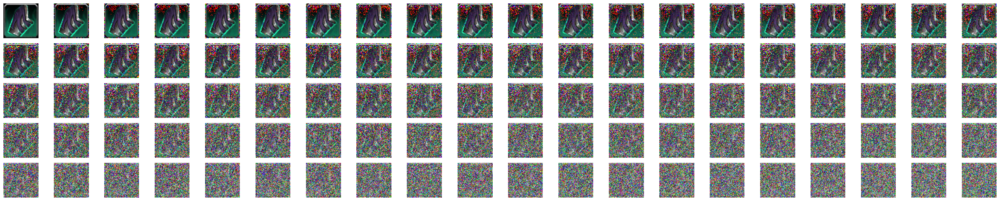

In [3]:
# Show a plot with  each image in a single row
from thumbs.util import unnormalize_image

it = iter(data)
item = next(it)

sample_interval = 10

ncols = 20
nrows = int(int(mparams.T/sample_interval) / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(30, 6))

last_img = None
last_noise = None
images = []

for i, t in enumerate(range(0, mparams.T, sample_interval)):
    img, noise = train.forward_diffusion_sample(item, t)
    img = unnormalize_image(img[0].numpy())
    images.append(img)


images.reverse()
for i in range(nrows):
    for j in range(ncols):
        axes[i,j].imshow(images.pop())
        axes[i,j].axis('off')  # Hide the axes ticks and labels
        last_img = img
        last_noise = noise

plt.subplots_adjust(wspace=0.0, hspace=0)
plt.tight_layout()
plt.show()


In [4]:
T = 300
batch_size = 128

r = np.random.randint(0, T - 1, size=(batch_size, 1))
# t = tf.constant([[np.random.randint(0, T-1)]] * batch_size, dtype=tf.int32)

r.shape

(128, 1)

# Show some predictions

<Figure size 640x480 with 0 Axes>

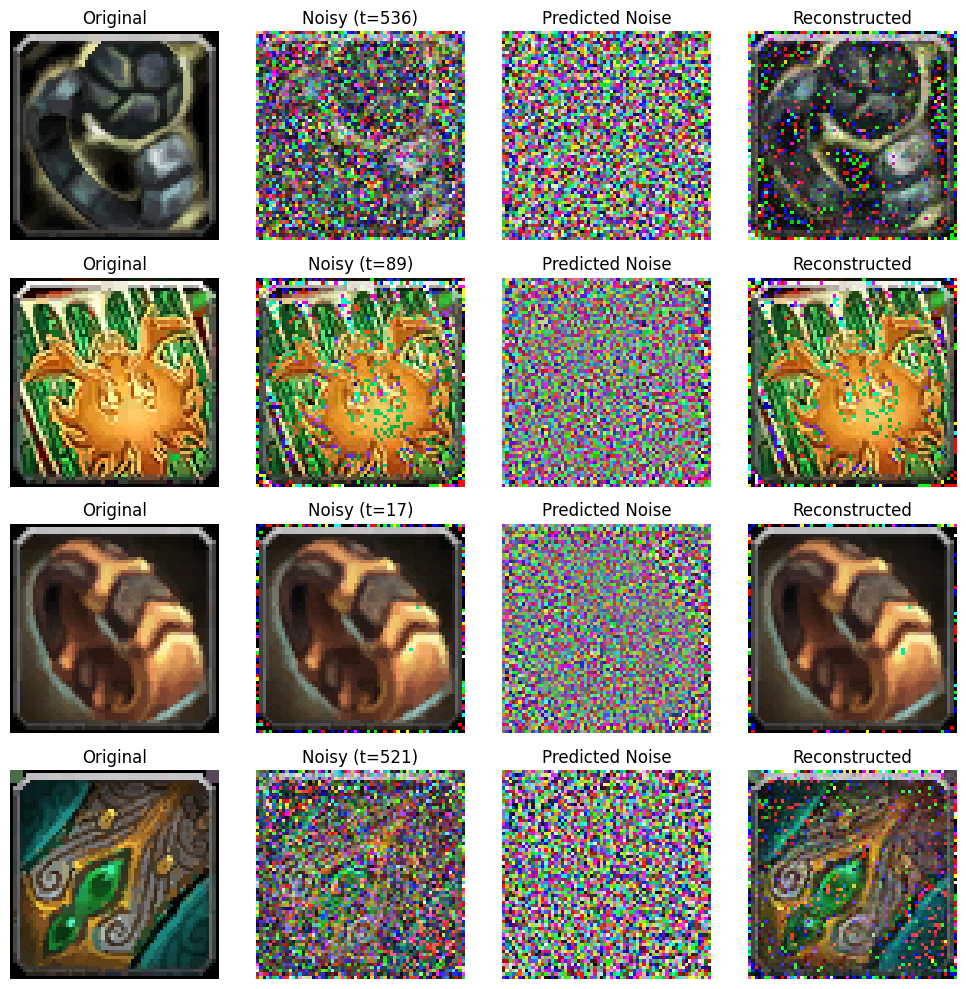

In [5]:
train.show_samples(data)

# Do a bunch of iterations on a single image

### Pick an image

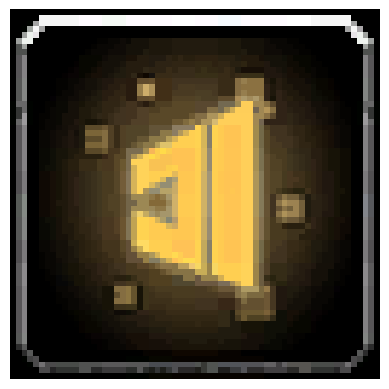

In [6]:
# Get a random image from the dataset
it = iter(data)
img = next(it)[0]
img = np.expand_dims(img, axis=0)
visualize_preprocessed_image(img[0])

### Noise it up

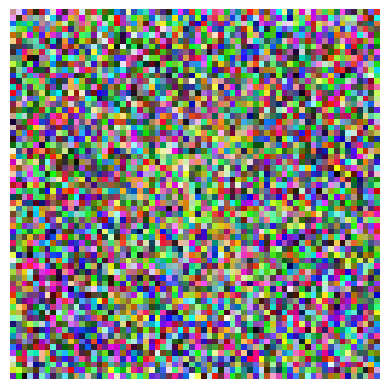

In [7]:
max_t = mparams.T - 1

noisy_img, noise = train.forward_diffusion_sample(img, np.expand_dims(max_t, axis=0))
visualize_preprocessed_image( noisy_img.numpy()[0])

### Un-noise it
Manually, without the model

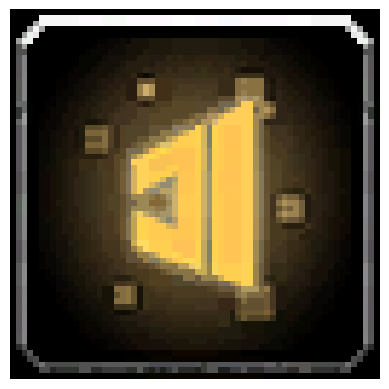

In [8]:
un_noised = train.reverse_diffusion_sample(noisy_img, noise, np.expand_dims(max_t, axis=0))
visualize_preprocessed_image(un_noised.numpy()[0])

# Generate new images


I made this way up but it makes sense

100%|██████████| 50/50 [00:07<00:00,  6.40it/s]


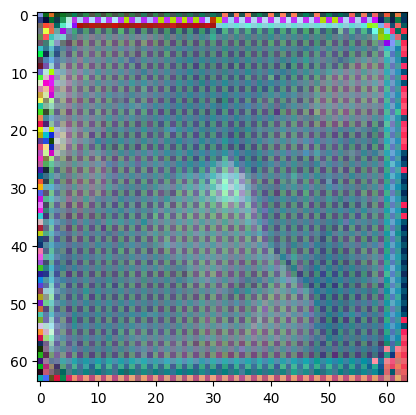

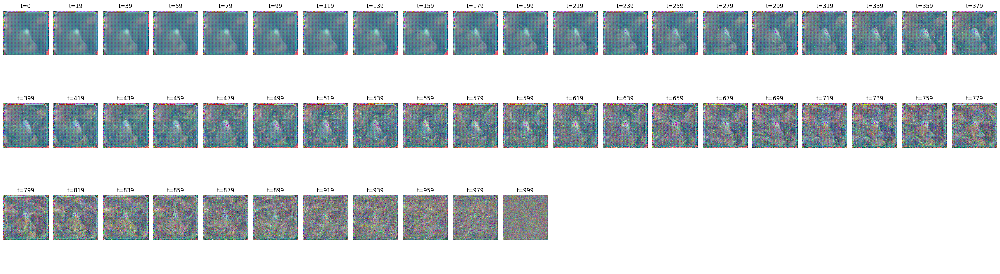

In [9]:
# with my way
step_size = 20
x, all = train.my_sample_new_images(1, step_size=step_size)
# plt.imshow(unnormalize_image( x[0].numpy()))
plt.imshow(unnormalize_image( x[0].numpy()))
plt.show()


# make a nxm grid of things in all
cols = step_size
rows = int(len(all) / step_size) + 1
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(10*rows, 3*rows))
for i in range(rows):
    for j in range(cols):
        if len(all) == 0:
            axes[i,j].axis('off')  # Hide the axes ticks and labels
        else:
            img, t = all.pop()
            # img = unnormalize_image( all[i*rows+j][0][0].numpy())
            # t = all[i*rows+j][0][1]
            axes[i,j].imshow(unnormalize_image( img[0].numpy()))
            axes[i,j].axis('off')  # Hide the axes ticks and labels
            axes[i,j].set_title(f"t={t}")

plt.subplots_adjust(wspace=0.0, hspace=0)
plt.tight_layout()
plt.show()


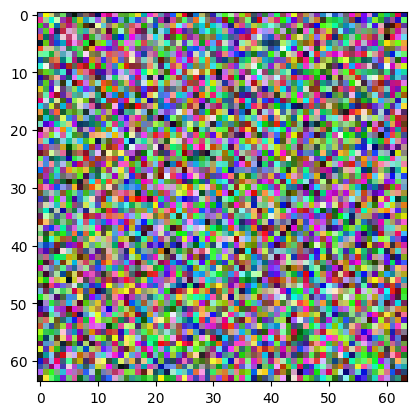

In [ ]:
plt.imshow( unnormalize_image( x[0].numpy()))

Got this online and can't make it work

Loaded previous weights


100%|██████████| 100/100 [00:23<00:00,  4.19it/s]


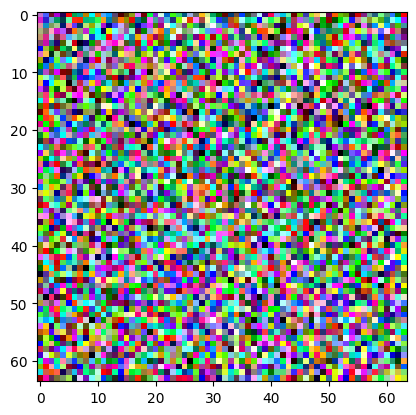

In [ ]:
train.load_weights()
img = train.sample_new_image(1)

plt.imshow(img[0].numpy())
plt.show()

### Test noise generation at each t and remove it from a noised image

Loaded previous weights


  0%|          | 0/100 [00:00<?, ?it/s]

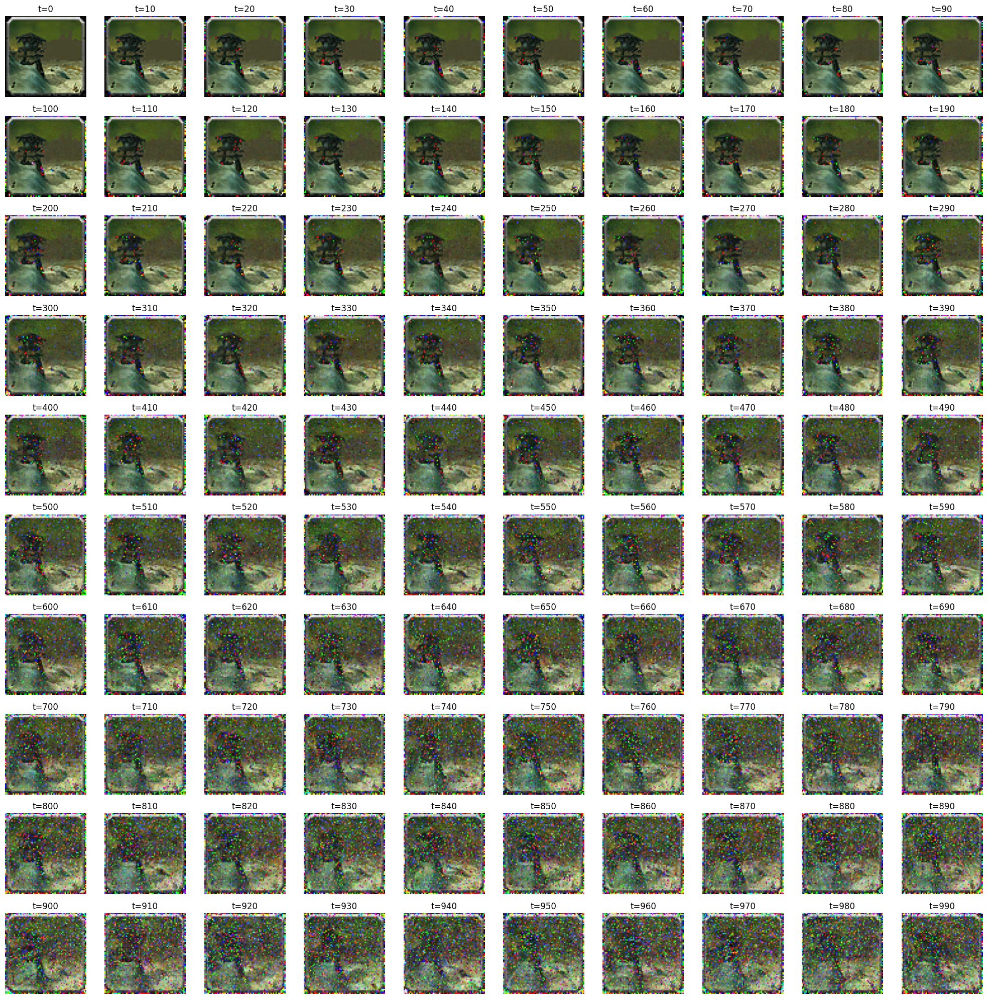

In [ ]:
# Show a plot with  each image in a single row
from thumbs.util import unnormalize_image
from tqdm.auto import tqdm

sample_interval = 10

ncols = 10
nrows = int(mparams.T/sample_interval / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))

images = []

train.load_weights()
for i, t in enumerate(tqdm(range(0, mparams.T - 1, 10))):
    t_tf = tf.constant(t, shape=(1,1))
    noisy, noise = train.forward_diffusion_sample(img, t_tf)

    predicted_noise = train.built_model.model.predict([noisy, t_tf], verbose=False)

    reconstructed = train.reverse_diffusion_sample(noisy, predicted_noise, np.expand_dims(t, axis=0))
    images.append(( unnormalize_image(reconstructed[0].numpy()), f"t={t}"))



images.reverse()
for i in range(nrows):
    for j in range(ncols):
        im, label = images.pop()
        axes[i,j].imshow(im)
        axes[i,j].set_title(label)
        axes[i,j].axis('off')

plt.subplots_adjust(wspace=0.0, hspace=0)
plt.tight_layout()
plt.show()
plt.close()


# Manual Run

In [10]:
train.load_weights()
# manual_img = noisy_img
manual_img = tf.random.normal(shape=tf.shape(noisy_img), mean=0.0, stddev=1.0)
t = 999

Loaded previous weights


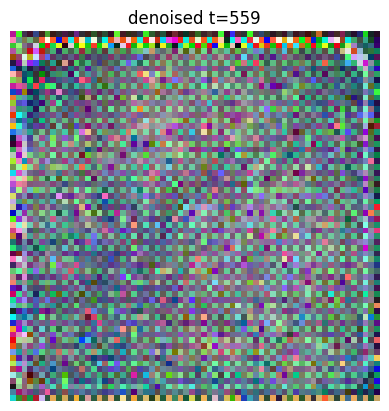

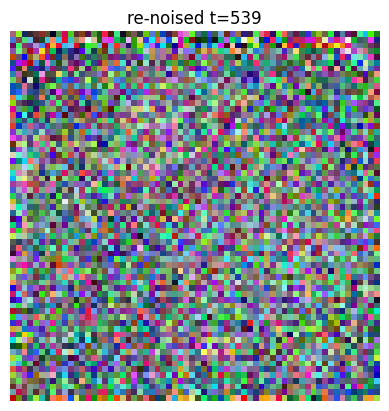

In [33]:
# Show a plot with  each image in a single row
from thumbs.util import unnormalize_image

next_t = t - 20

t_tf = tf.constant(t, shape=(1,1))
next_t_tf = tf.constant(next_t, shape=(1,1))
predicted_noise = train.built_model.model.predict([manual_img, t_tf], verbose=False)
manual_img = train.reverse_diffusion_sample(manual_img, predicted_noise, t_tf)

plt.imshow(unnormalize_image(manual_img[0].numpy()))
plt.title(f'denoised t={t}')
plt.axis('off')
plt.show()

manual_img, new_noise = train.forward_diffusion_sample(manual_img, next_t_tf)
t = next_t



plt.imshow(unnormalize_image(manual_img[0].numpy()))
plt.title(f're-noised t={t}')
plt.axis('off')
plt.show()


In [ ]:

# Show a plot with  each image in a single row
from thumbs.util import unnormalize_image
from tqdm.auto import tqdm

# next_t = t - 30

start = 999
step = 20
diffusion_img = noisy_img
final = None
for t in tqdm(range(start, 0, -step)):
    if t < 0:
        break
    t_tf = tf.constant(t, shape=(1,1))
    predicted_noise = train.built_model.model.predict([diffusion_img, t_tf], verbose=False)
    diffusion_img = train.reverse_diffusion_sample(diffusion_img, predicted_noise, t_tf)
    final = diffusion_img

    if t - step < 0:
        break
    diffusion_img, new_noise = train.forward_diffusion_sample(diffusion_img, t - step)


plt.imshow(unnormalize_image(final[0].numpy()))
# plt.title(f'denoised t={t}')
plt.axis('off')
plt.show()

# plt.imshow(unnormalize_image(manual_img[0].numpy()))
# plt.title(f're-noised t={t}')
# plt.axis('off')
# plt.show()
